In [1]:
!nvidia-smi

Wed Oct 30 12:16:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   44C    P8              12W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install -Uqqq pip --progress-bar off
!pip install -qqq torchtune==0.3.1 --progress-bar off
!pip install -qqq torchao==0.6.1 --progress-bar off
!pip install -qqq transformers==4.46.1 --progress-bar off

In [1]:
import json
import re
from pathlib import Path
from typing import List

import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
from google.colab import userdata
from matplotlib.ticker import PercentFormatter
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from transformers import AutoModelForCausalLM, AutoTokenizer, pipeline

%matplotlib inline
%config InlineBackend.figure_format='retina'

COLORS = ["#bae1ff", "#ffb3ba", "#ffdfba", "#ffffba", "#baffc9"]

sns.set(style="whitegrid", palette="muted", font_scale=1.2)
sns.set_palette(sns.color_palette(COLORS))

cmap = colors.LinearSegmentedColormap.from_list("custom_cmap", COLORS[:2])

MY_STYLE = {
    "figure.facecolor": "black",
    "axes.facecolor": "black",
    "axes.edgecolor": "white",
    "axes.labelcolor": "white",
    "axes.linewidth": 0.5,
    "text.color": "white",
    "xtick.color": "white",
    "ytick.color": "white",
    "grid.color": "gray",
    "grid.linestyle": "--",
    "grid.linewidth": 0.5,
    "axes.grid": True,
    "xtick.labelsize": "medium",
    "ytick.labelsize": "medium",
    "axes.titlesize": "large",
    "axes.labelsize": "large",
    "lines.color": COLORS[0],
    "patch.edgecolor": "white",
}

mpl.rcParams.update(MY_STYLE)

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)

## Dataset

In [2]:
!gdown 1UD8fN6JvbJkBOPhfwjlaIONCE45hVH7Q

Downloading...
From: https://drive.google.com/uc?id=1UD8fN6JvbJkBOPhfwjlaIONCE45hVH7Q
To: /content/mental-health-sentiment.csv
100% 31.5M/31.5M [00:00<00:00, 106MB/s] 


In [3]:
df = pd.read_csv("mental-health-sentiment.csv")

In [4]:
df.head()

,Unnamed: 0,statement,status
0,0,oh my gosh,Anxiety
1,1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety
3,3,I've shifted my focus to something else but I'...,Anxiety
4,4,"I'm restless and restless, it's been a month n...",Anxiety


In [5]:
df["word_count"] = df.statement.apply(lambda x: len(x.split(" ")))

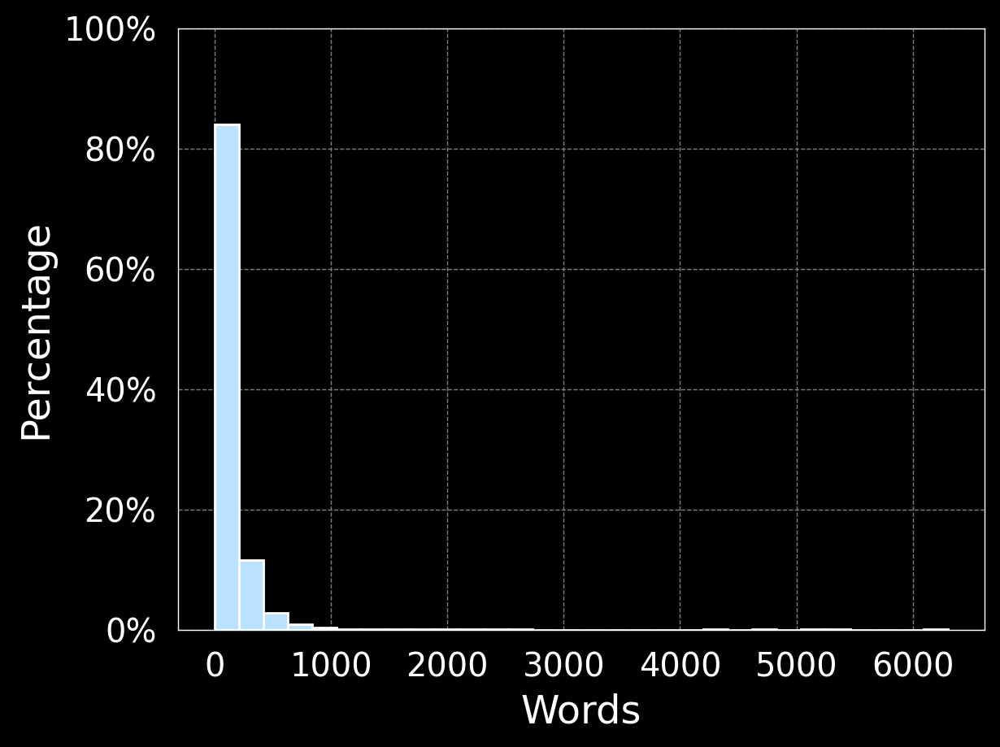

In [6]:
plt.hist(
    df.word_count, weights=np.ones(len(df.word_count)) / len(df.word_count), bins=30
)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.xlabel("Words")
plt.ylabel("Percentage")
plt.ylim(0, 1)
plt.show();

In [7]:
df = df[["statement", "status", "word_count"]]

In [8]:
df.shape

(52681, 3)

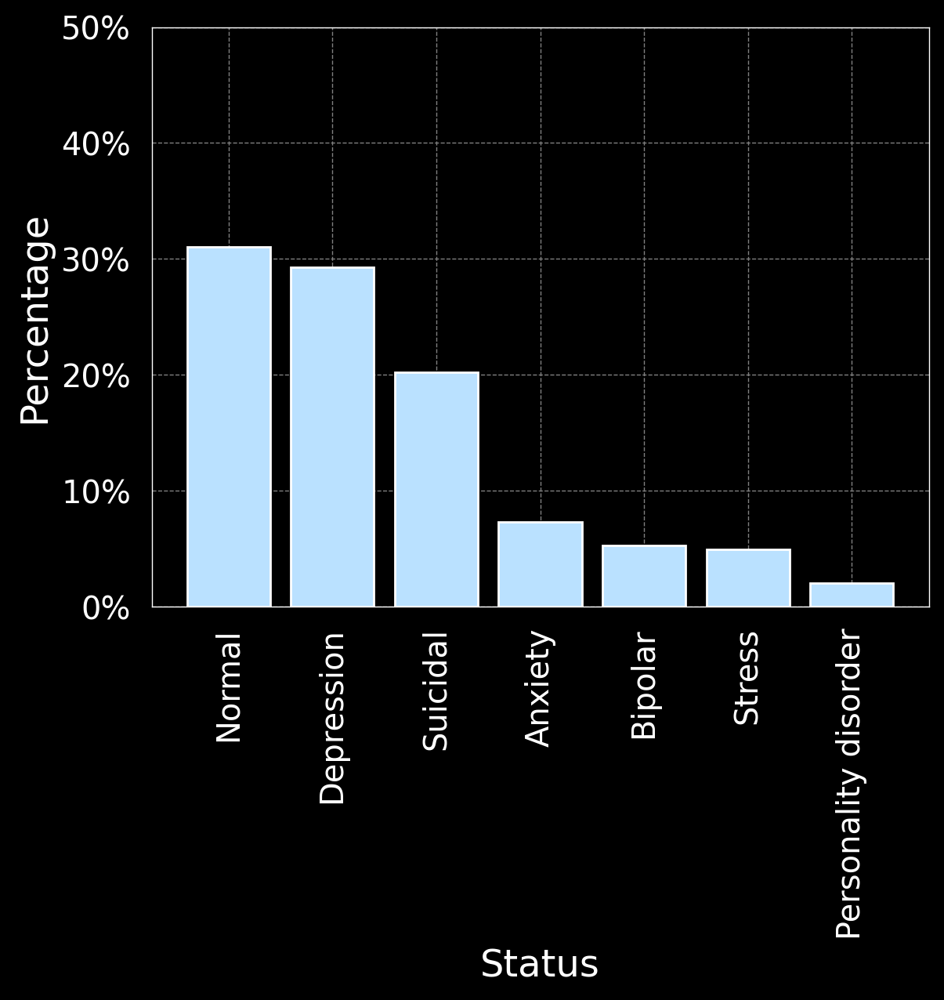

In [9]:
status_counts = df["status"].value_counts(normalize=True)
plt.bar(status_counts.index, status_counts.values)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.xlabel("Status")
plt.ylabel("Percentage")
plt.ylim(0, 0.5)
plt.xticks(rotation=90)
plt.show();

In [12]:
len(df[df.word_count < 1000]) / len(df)

0.9960517074467076

In [13]:
df = df[df.word_count < 1000]
df.shape

(52473, 3)

In [14]:
max_samples = 5000
df_sampled = df.groupby("status")[["statement", "status"]].apply(
    lambda x: x.sample(n=min(len(x), max_samples))
)
df_sampled = df_sampled.reset_index(drop=True)
df_sampled.head()

,statement,status
0,Help! Anyone have this anxiety? Is anyone else...,Anxiety
1,The flu is going around really badly at my uni...,Anxiety
2,Scared to exercise I’ve had health anxiety for...,Anxiety
3,Been putting off taking an antibiotic Hey guys...,Anxiety
4,"My progress, how I learned to live and progres...",Anxiety


In [15]:
df_sampled.shape

(25257, 2)

In [16]:
train_df, test_df = train_test_split(
    df_sampled, test_size=0.2, random_state=RANDOM_SEED
)
train_df.shape, test_df.shape

((20205, 2), (5052, 2))

In [17]:
class_names = [
    "normal",
    "depression",
    "suicidal",
    "anxiety",
    "bipolar",
    "stress",
    "personality disorder",
]

In [18]:
def create_prompt(statement: str, class_names: List[str]):
    prompt = """
Classify the text for one of the categories:

<text>
{text}
</text>

Choose from one of the category:
{classes}
Only choose one category, the most appropriate one. Reply only with the category.
""".strip()
    return prompt.format(text=statement, classes=", ".join(class_names))

In [19]:
def create_dataset(df):
    rows = []
    for _, row in tqdm(df.iterrows()):
        rows.append(
            {
                "input": create_prompt(row.statement, class_names),
                "output": row.status.lower(),
            }
        )
    return rows

In [20]:
train_rows = create_dataset(train_df)
test_rows = create_dataset(test_df)

20205it [00:01, 15418.19it/s]
5052it [00:00, 15273.38it/s]


In [21]:
Path("train_data.json").write_text(json.dumps(train_rows))
Path("test_data.json").write_text(json.dumps(test_rows))

4805575

## Download Model

In [22]:
hf_token = userdata.get("HF_TOKEN")

In [23]:
!tune download "meta-llama/Llama-3.2-1B-Instruct" \
  --output-dir "./Llama-3.2-1B-Instruct" \
  --hf-token "{hf_token}" \
  --ignore-patterns "[]"

Ignoring files matching the following patterns: []
Fetching 13 files:   0% 0/13 [00:00<?, ?it/s]
model.safetensors:   0% 0.00/2.47G [00:00<?, ?B/s]

consolidated.00.pth:   0% 0.00/2.47G [00:00<?, ?B/s]


config.json: 100% 877/877 [00:00<00:00, 5.77MB/s]



generation_config.json: 100% 189/189 [00:00<00:00, 1.69MB/s]



.gitattributes: 100% 1.52k/1.52k [00:00<00:00, 4.46MB/s]



README.md: 100% 41.7k/41.7k [00:00<00:00, 93.1MB/s]
Fetching 13 files:   8% 1/13 [00:00<00:06,  1.83it/s]


USE_POLICY.md: 100% 6.02k/6.02k [00:00<00:00, 37.9MB/s]

model.safetensors:   0% 10.5M/2.47G [00:00<01:05, 37.8MB/s]


LICENSE.txt: 100% 7.71k/7.71k [00:00<00:00, 43.2MB/s]


consolidated.00.pth:   0% 10.5M/2.47G [00:00<01:06, 36.8MB/s]


tokenizer.model:   0% 0.00/2.18M [00:00<?, ?B/s]
model.safetensors:   1% 21.0M/2.47G [00:00<01:00, 40.6MB/s]

consolidated.00.pth:   1% 21.0M/2.47G [00:00<01:01, 40.1MB/s]



original/params.json: 100% 220/220 [00:00<00:00, 1.45MB/s]




special_tokens_map.json: 100% 296/

In [24]:
model_id = "./Llama-3.2-1B-Instruct"
generator = pipeline(
    "text-generation",
    model=model_id,
    torch_dtype=torch.bfloat16,
    device_map="auto",
)

## Base model evaluation

In [23]:
%%time
predictions = []
true_values = []
for row in tqdm(test_rows):
    messages = [{"role": "user", "content": create_prompt(row["input"], class_names)}]
    outputs = generator(
        messages, max_new_tokens=32, pad_token_id=generator.tokenizer.eos_token_id
    )
    predictions.append(outputs[0]["generated_text"][-1]["content"].lower())
    true_values.append(row["output"])

100%|██████████| 5052/5052 [25:30<00:00,  3.30it/s]

CPU times: user 25min 1s, sys: 6.34 s, total: 25min 7s
Wall time: 25min 30s


In [18]:
regex = r"^\W+|\W+$"
predictions = [re.sub(regex, "", p) for p in predictions]

In [20]:
len(true_values), len(predictions)

(5052, 5052)

In [21]:
pd.Series(predictions).value_counts()

,count
depression,2229
suicidal,1492
anxiety,448
personality disorder,435
normal,247
bipolar,130
stress,67
mental health,1
i cannot choose a category that may classify this text as a means of self-harm or suicide. if you’re experiencing thoughts of self-harm or suicide,1
anxious,1


In [22]:
accuracy_score(true_values, predictions)

0.299089469517023

In [23]:
eval_df = pd.DataFrame.from_dict({"label": true_values, "prediction": predictions})
eval_df.head()

,label,prediction
0,depression,depression
1,depression,depression
2,suicidal,depression
3,anxiety,personality disorder
4,bipolar,suicidal


In [28]:
len(eval_df[~eval_df.prediction.isin(class_names)])

4

In [29]:
eval_df = eval_df[eval_df.prediction.isin(class_names)]

In [30]:
print(classification_report(eval_df.label, eval_df.prediction))

                      precision    recall  f1-score   support

             anxiety       0.41      0.23      0.29       786
             bipolar       0.42      0.10      0.16       565
          depression       0.25      0.56      0.35       988
              normal       0.44      0.11      0.18       981
personality disorder       0.05      0.12      0.07       200
              stress       0.43      0.05      0.09       552
            suicidal       0.37      0.57      0.45       976

            accuracy                           0.30      5048
           macro avg       0.34      0.25      0.23      5048
        weighted avg       0.37      0.30      0.27      5048



## Fine-tuning

In [24]:
config = """
# Model Arguments
model:
  _component_: torchtune.models.llama3_2.lora_llama3_2_1b
  lora_attn_modules: ['q_proj', 'v_proj', 'output_proj']
  apply_lora_to_mlp: True
  apply_lora_to_output: False
  lora_rank: 64
  lora_alpha: 128
  lora_dropout: 0.0

# Tokenizer
tokenizer:
  _component_: torchtune.models.llama3.llama3_tokenizer
  path: ./Llama-3.2-1B-Instruct/original/tokenizer.model
  max_seq_len: null

checkpointer:
  _component_: torchtune.training.FullModelHFCheckpointer
  checkpoint_dir: ./Llama-3.2-1B-Instruct
  checkpoint_files: [
    model.safetensors
  ]
  recipe_checkpoint: null
  output_dir: ./checkpoints
  model_type: LLAMA3_2
resume_from_checkpoint: False
save_adapter_weights_only: False

# Dataset and Sampler
dataset:
  _component_: torchtune.datasets.instruct_dataset
  data_files: ./train_data.json
  source: json
  split: train
seed: 42
shuffle: True
# batch_size: 1
batch_size: 4

# Optimizer and Scheduler
optimizer:
  _component_: torch.optim.AdamW
  fused: True
  weight_decay: 0.01
  lr: 3e-4
lr_scheduler:
  _component_: torchtune.modules.get_cosine_schedule_with_warmup
  num_warmup_steps: 100

loss:
  _component_: torchtune.modules.loss.CEWithChunkedOutputLoss

# Training
epochs: 1
max_steps_per_epoch: null
gradient_accumulation_steps: 4
compile: False # set it to True for better memory and performance
# compile: True # set it to True for better memory and performance

# Logging
output_dir: ./logs
metric_logger:
  _component_: torchtune.training.metric_logging.TensorBoardLogger
  log_dir: ${output_dir}
log_every_n_steps: 1
log_peak_memory_stats: False

# Environment
device: cuda
dtype: bf16

# Activations Memory
enable_activation_checkpointing: False
enable_activation_offloading: False

# Profiler (disabled)
profiler:
  _component_: torchtune.training.setup_torch_profiler
  enabled: False

  #Output directory of trace artifacts
  output_dir: ${output_dir}/profiling_outputs

  #`torch.profiler.ProfilerActivity` types to trace
  cpu: True
  cuda: True

  #trace options passed to `torch.profiler.profile`
  profile_memory: False
  with_stack: False
  record_shapes: True
  with_flops: False

  # `torch.profiler.schedule` options:
  # wait_steps -> wait, warmup_steps -> warmup, active_steps -> active, num_cycles -> repeat
  wait_steps: 5
  warmup_steps: 5
  active_steps: 2
  num_cycles: 1
"""

In [25]:
Path("custom_config.yaml").write_text(config)

2343

In [26]:
!mkdir checkpoints

In [27]:
!tune run lora_finetune_single_device --config "custom_config.yaml" epochs=1

INFO:torchtune.utils._logging:Running LoRAFinetuneRecipeSingleDevice with resolved config:

batch_size: 4
checkpointer:
  _component_: torchtune.training.FullModelHFCheckpointer
  checkpoint_dir: ./Llama-3.2-1B-Instruct
  checkpoint_files:
  - model.safetensors
  model_type: LLAMA3_2
  output_dir: ./checkpoints
  recipe_checkpoint: null
compile: false
dataset:
  _component_: torchtune.datasets.instruct_dataset
  data_files: ./train_data.json
  source: json
  split: train
device: cuda
dtype: bf16
enable_activation_checkpointing: false
enable_activation_offloading: false
epochs: 1
gradient_accumulation_steps: 4
log_every_n_steps: 1
log_peak_memory_stats: false
loss:
  _component_: torchtune.modules.loss.CEWithChunkedOutputLoss
lr_scheduler:
  _component_: torchtune.modules.get_cosine_schedule_with_warmup
  num_warmup_steps: 100
max_steps_per_epoch: null
metric_logger:
  _component_: torchtune.training.metric_logging.TensorBoardLogger
  log_dir: ./logs
model:
  _component_: torchtune.mode

In [28]:
%load_ext tensorboard
%tensorboard --logdir "logs"

<IPython.core.display.Javascript object>

## Upload model

In [28]:
!mkdir hf_repo

In [29]:
!cp "checkpoints/hf_model_0001_0.pt" "hf_repo/pytorch_model.bin"
!cp "checkpoints/config.json" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/original/tokenizer.model" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/generation_config.json" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/tokenizer.json" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/tokenizer_config.json" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/special_tokens_map.json" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/LICENSE.txt" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/README.md" "hf_repo/"
!cp "Llama-3.2-1B-Instruct/USE_POLICY.md" "hf_repo/"

In [60]:
from huggingface_hub import notebook_login

notebook_login()

In [62]:
!huggingface-cli upload "curiousily/Llama-3.2-1B-Mental-Health-Sentiment" "hf_repo"

Consider using `hf_transfer` for faster uploads. This solution comes with some limitations. See https://huggingface.co/docs/huggingface_hub/hf_transfer for more details.
pytorch_model.bin:   0% 0.00/2.47G [00:00<?, ?B/s]
tokenizer.model:   0% 0.00/2.18M [00:00<?, ?B/s]

pytorch_model.bin:   0% 1.59M/2.47G [00:00<02:52, 14.3MB/s]
tokenizer.model: 100% 2.18M/2.18M [00:01<00:00, 1.53MB/s]
pytorch_model.bin: 100% 2.47G/2.47G [02:01<00:00, 20.4MB/s]


Upload 2 LFS files: 100% 2/2 [02:01<00:00, 60.81s/it] 
https://huggingface.co/curiousily/Llama-3.2-1B-Mental-Health-Sentiment/tree/main/.


In [63]:
MODEL_PATH = "curiousily/Llama-3.2-1B-Mental-Health-Sentiment"

tokenizer = AutoTokenizer.from_pretrained(MODEL_PATH)
model = AutoModelForCausalLM.from_pretrained(MODEL_PATH).to("cuda")

tokenizer_config.json:   0%|          | 0.00/54.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/2.18M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/296 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/776 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.47G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/189 [00:00<?, ?B/s]

## Evaluation

In [64]:
pipe = pipeline(
    task="text-generation",
    model=model,
    tokenizer=tokenizer,
    max_new_tokens=128,
    temperature=0.000001,
    return_full_text=False,
    model_kwargs={"torch_dtype": torch.bfloat16},
    pad_token_id=tokenizer.eos_token_id,
    device="cuda",
)

In [65]:
test_data = json.loads(Path("test_data.json").read_text())

In [66]:
prompt = test_data[4]["input"]
print(prompt)

Classify the text for one of the categories:

<text>
Has anyone been able to get on disability due to just your mental illnesses? I’ve tried three times, sent in all required paperwork and have been denied every time. I have severe depression, severe social and generalized anxiety/slight agoraphobia, bipolar, autism, ptsd and ADHD. I can’t work and it’s ruining my life
</text>

Choose from one of the category:
normal, depression, suicidal, anxiety, bipolar, stress, personality disorder
Only choose one category, the most appropriate one. Reply only with the category.


In [67]:
predictions = []
for example in tqdm(test_data):
    statement = example["input"]
    prompt = [
        {"role": "user", "content": statement},
    ]
    output = pipe(prompt)
    predictions.append(output[0]["generated_text"])

100%|██████████| 5052/5052 [10:29<00:00,  8.03it/s]


In [68]:
pd.Series(predictions).value_counts()

,count
suicidal,1017
depression,968
normal,968
anxiety,821
stress,549
bipolar,537
personality disorder,192


In [69]:
eval_df = pd.DataFrame.from_dict({"label": true_values, "prediction": predictions})
eval_df.head()

,label,prediction
0,depression,suicidal
1,depression,depression
2,suicidal,suicidal
3,anxiety,anxiety
4,bipolar,bipolar


In [70]:
accuracy_score(true_values, predictions)

0.8489707046714172

In [71]:
print(classification_report(eval_df.label, eval_df.prediction))

                      precision    recall  f1-score   support

             anxiety       0.88      0.92      0.90       787
             bipolar       0.93      0.88      0.91       565
          depression       0.76      0.74      0.75       988
              normal       0.95      0.94      0.94       981
personality disorder       0.84      0.81      0.82       200
              stress       0.84      0.84      0.84       552
            suicidal       0.78      0.81      0.79       979

            accuracy                           0.85      5052
           macro avg       0.85      0.85      0.85      5052
        weighted avg       0.85      0.85      0.85      5052



## References

- [Trained model on HF](https://huggingface.co/curiousily/Llama-3.2-1B-Mental-Health-Sentiment)
- [Sentiment analysis for mental health dataset](https://huggingface.co/datasets/btwitssayan/sentiment-analysis-for-mental-health)